<a href="https://colab.research.google.com/github/Kirieshka124/ml_basics/blob/main/%D0%9F%D1%80%D0%B0%D0%BA%D1%82%D0%B8%D1%87%D0%B5%D1%81%D0%BA%D0%B0%D1%8F_%D1%80%D0%B0%D0%B1%D0%BE%D1%82%D0%B0_%E2%84%9613_%D0%93%D0%B5%D0%BE%D0%B0%D0%BD%D0%B0%D0%BB%D0%B8%D0%B7_%D1%8D%D0%BA%D0%BE%D0%BB%D0%BE%D0%B3%D0%B8%D1%87%D0%B5%D1%81%D0%BA%D0%B8%D1%85_%D1%84%D0%B0%D0%BA%D1%82%D0%BE%D1%80%D0%BE%D0%B2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Практическая работа. Геоанализ экологических факторов городской среды с применением методов пространственной кластеризации**




















## **Цель работы**



Освоение методов пространственного анализа и машинного обучения для оценки экологической обстановки городской территории с использованием гексагональной сетки H3, с последующим применением различных алгоритмов кластеризации и классификации.

## **Задачи**



1. Освоить инструменты загрузки и агрегации экологических геоданных с использованием API OpenStreetMap
2. Реализовать анализ пространственного распределения экологических факторов с помощью гексагональной сетки H3
3. Применить и сравнить различные алгоритмы кластеризации для выявления однородных экологических зон
4. Обучить модели классификации для прогнозирования экологического состояния новых территорий

## **Теоретическая часть**



Современный геоэкологический анализ требует комплексного подхода к обработке пространственно-распределенных данных. Применение методов машинного обучения, в частности алгоритмов кластеризации (K-means, агломеративной, спектральной, DBSCAN, HDBSCAN), позволяет выявлять неявные закономерности в распределении экологических факторов городской среды и определять территории со схожими экологическими характеристиками.

## **Этапы работы**



### **1. Определение области исследования и подготовка данных**


- Выберите городскую территорию для анализа экологической обстановки
- Используя API OpenStreetMap, загрузите данные следующих категорий:
  - Источники загрязнения (промышленные предприятия, мусоропереработка, ТЭЦ)
  - Зеленые насаждения (парки, скверы, лесопарковые зоны)
  - Водные объекты (реки, водоемы)
  - Автомагистрали (категории дорог с интенсивным движением)
  - Административные районы города

In [1]:
!pip install scikit-learn geopandas h3pandas h3~=3.0 leafmap mapclassify matplotlib streamlit osmnx openrouteservice polyline -q
import geopandas as gpd
import pandas as pd
import numpy as np
import h3
import h3pandas
import leafmap
from shapely.geometry import box
from sklearn.preprocessing import MinMaxScaler

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 138.4/138.4 kB 5.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 16.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 667.5/667.5 kB 13.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.2/9.2 MB 31.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.4/104.4 kB 3.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.5/21.5 MB 40.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.7/2.7 MB 44.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.3/11.3 MB 36.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.3/6.3 MB 43.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 16.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.8/41.8 kB 1.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 108.6/108.6 kB 4.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━

In [ ]:
# m = leafmap.Map(draw_control=True, basemap='CartoDB.Positron')
# m
# bbox = m.user_roi_bounds()

Map(center=[20, 0], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out_text…

In [2]:
import osmnx as ox
import warnings

# Функция загрузки данных из OSM
def load_osm_data(bbox):
    west, south, east, north = bbox  # bbox = (west, south, east, north)

    # Теги для поиска
    tags = {
      'pollution_sources': {'landuse': ['industrial', 'landfill'], 'power': 'plant', 'man_made': 'works'},
      'green_spaces': {'leisure': ['park', 'garden'], 'natural': 'wood', 'landuse': 'forest'},
      'water_bodies': {'waterway': 'river', 'natural': 'water', 'water': ['lake', 'reservoir', 'pond']},
      'highways': {'highway': ['primary', 'trunk', 'motorway', 'secondary', 'tertiary']},
      'administrative_districts': {'boundary': 'administrative', 'admin_level': '8'}
    }

    # Загрузка данных с обработкой исключений
    data = {}
    for key, tag in tags.items():
        print(f"Загрузка {key}...")
        try:
            gdf = ox.features_from_bbox((west, south, east, north), tags=tag)
            data[key] = gdf
        except:
            print(f"Нет данных для {key} в заданном регионе. Создаём пустой GeoDataFrame.")
            # Создаём пустой GeoDataFrame с колонкой 'geometry' и устанавливаем CRS
            data[key] = gpd.GeoDataFrame(columns=['geometry'], crs="EPSG:4326")

    return data

m = leafmap.Map(draw_control=True, basemap='CartoDB.Positron')
bbox = m.user_roi_bounds()
if bbox:
    print(f"Выбранный bounding box: {bbox}")
else:
    bbox = [37.674115, 55.705142, 37.781310, 55.644566]
    print(f"Область не выбрана. Используем значение по умолчанию: {bbox}")
data = load_osm_data(bbox)

# Приводим данные к нужному CRS
crs_proj = "EPSG:3857"
for key in data.keys():
    # Проверяем, что GeoDataFrame не пустой
    if not data[key].empty and 'geometry' in data[key].columns:
        data[key] = data[key].to_crs(crs_proj)
    else:
        # Если пустой, создаём пустой GeoDataFrame с нужным CRS и колонкой 'geometry'
        data[key] = gpd.GeoDataFrame(columns=['geometry'], crs=crs_proj)

Область не выбрана. Используем значение по умолчанию: [37.674115, 55.705142, 37.78131, 55.644566]
Загрузка pollution_sources...
Загрузка green_spaces...
Загрузка water_bodies...
Загрузка highways...
Загрузка administrative_districts...


### **2. Агрегация данных с использованием гексагональной сетки H3**


- Сгенерируйте гексагональную сетку H3 оптимального разрешения для выбранной территории
- Для каждой ячейки H3 рассчитайте:
  - Количество и плотность источников загрязнения в радиусе 1600м
  - Площадь и процент покрытия зелеными насаждениями в радиусе 800м
  - Протяженность водных объектов в радиусе 1600м
  - Плотность автомагистралей в радиусе 1600м
- Выполните нормализацию полученных показателей
- Сформируйте интегральный индекс экологического благополучия территории


In [23]:
from shapely.geometry import box, Polygon

# Функция анализа для каждой H3 ячейки
def analyze_h3_cell(geom):
    buffer_1600m = geom.buffer(1600)
    buffer_800m = geom.buffer(800)
    num_pollution = data['pollution_sources'][data['pollution_sources'].geometry.intersects(buffer_1600m)].shape[0]
    water_length = data['water_bodies'][data['water_bodies'].geometry.intersects(buffer_1600m)].length.sum()
    highways_length = data['highways'][data['highways'].geometry.intersects(buffer_1600m)].length.sum()
    green_area = data['green_spaces'][data['green_spaces'].geometry.intersects(buffer_800m)].area.sum()
    return num_pollution, water_length, highways_length, green_area

# Генерация H3-сетки
resolution = 10 # Можно настроить разрешение

# Создаем полигон bbox
bbox_polygon = box(*bbox)
bbox_gdf = gpd.GeoDataFrame(geometry=[bbox_polygon], crs="EPSG:4326").to_crs(crs_proj)

# Получаем индексы H3 внутри bbox
h3_indexes = list(h3.polyfill_geojson(bbox_polygon.__geo_interface__, resolution))

# Импортируем Polygon из shapely.geometry
from shapely.geometry import Polygon

# Создаем GeoDataFrame с H3 ячейками
h3_geometries = [Polygon(h3.h3_to_geo_boundary(h, geo_json=True)) for h in h3_indexes]
h3_gdf = gpd.GeoDataFrame({'h3_index': h3_indexes, 'geometry': h3_geometries}, crs="EPSG:4326").to_crs(crs_proj)

# Применяем анализ к каждой H3 ячейке
features = ['num_pollution', 'water_length', 'highways_length', 'green_area']
h3_gdf[features] = h3_gdf.geometry.apply(
    lambda geom: pd.Series(analyze_h3_cell(geom))
)

# Нормализация результатов
scaler = MinMaxScaler()
h3_gdf[features] = scaler.fit_transform(h3_gdf[features])

# Вычисление итогового индекса
features_good = ['water_length', 'green_area']
features_bad = ['num_pollution', 'highways_length']
h3_gdf['index_score'] = h3_gdf[features_good].sum(axis=1) - h3_gdf[features_bad].sum(axis=1)

In [24]:
h3_gdf[features].describe()

,num_pollution,water_length,highways_length,green_area
count,3206.00000,3206.000000,3206.000000,3206.000000
mean,0.32185,0.302424,0.383414,0.136113
std,0.22197,0.274677,0.214893,0.287898
min,0.00000,0.000000,0.000000,0.000000
25%,0.15000,0.067002,0.216374,0.003920
50%,0.25000,0.227824,0.373781,0.014466
75%,0.50000,0.533015,0.514156,0.063695
max,1.00000,1.000000,1.000000,1.000000


In [25]:
h3_gdf['index_score'].describe()

,index_score
count,3206.000000
mean,-0.266727
std,0.547190
min,-1.597314
25%,-0.649833
50%,-0.309958
75%,0.143955
max,0.852271


In [26]:
h3_gdf_viz = h3_gdf.to_crs("EPSG:4326")

map_h3 = leafmap.Map(
    center=[(bbox[1]+bbox[3])/2, (bbox[0]+bbox[2])/2],
    zoom=11, basemap='CartoDB.Positron'
)

map_h3.add_data(
    h3_gdf_viz,
    column="index_score",
    cmap="OrRd_r",
    legend_title="Индекс обеспеченности",
    k=20,
    layer_name="H3 Сетка",
    style={
        "stroke": True,
        "weight": 0,
        "fillOpacity": 0.7,
    }
)

map_h3

Map(center=[55.674853999999996, 37.727712499999996], controls=(ZoomControl(options=['position', 'zoom_in_text'…

### **3. Определение оптимального числа кластеров**


- Постройте график метода локтя (Elbow method) для определения оптимального числа кластеров
- Оцените качество кластеризации с помощью внутренних метрик кластеризации
- Определите оптимальное число кластеров на основе комбинации различных метрик

In [27]:
# Выбираем числовые признаки для кластеризации
features2 = ['num_pollution', 'water_length', 'highways_length', 'green_area', 'index_score']

# Делаем копию исходного набора для обработки методами ML
X = h3_gdf[features2].copy()
scaler = MinMaxScaler()

X_scaled = scaler.fit_transform(X)
X_scaled_df = pd.DataFrame(X_scaled, columns=features2)

# Сохраняем оригинальные индексы
X_scaled_df.index = h3_gdf.index

print("Размерность набора данных:", X_scaled.shape)
X_scaled_df.head()

Размерность набора данных: (3206, 5)


,num_pollution,water_length,highways_length,green_area,index_score
0,0.30,0.068908,0.903556,0.044598,0.207082
1,0.25,0.717153,0.806050,0.017968,0.521062
2,0.30,0.727787,0.631668,0.017815,0.576117
3,0.45,0.025982,0.440827,0.004886,0.301012
4,0.20,0.509330,0.275103,0.004720,0.667975


In [20]:
%%capture
!pip install kneed

In [30]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

def find_optimal_clusters(X, max_k=15):
    """
    Определение оптимального числа кластеров с помощью различных метрик
    """
    inertias = []
    silhouette_scores = []
    calinski_scores = []
    davies_scores = []

    k_range = range(2, max_k + 1)

    for k in k_range:
        print(f"Оценка для k={k}...")
        kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
        kmeans.fit(X)

        labels = kmeans.labels_
        inertias.append(kmeans.inertia_)

        # Silhouette может быть медленным на больших данных, добавляем проверку
        if len(np.unique(labels)) > 1:
            silhouette_scores.append(silhouette_score(X, labels))
        else:
            silhouette_scores.append(-1)

        calinski_scores.append(calinski_harabasz_score(X, labels))
        davies_scores.append(davies_bouldin_score(X, labels))

    # Визуализация
    fig, axes = plt.subplots(2, 2, figsize=(14, 10))

    # График 1: Метод локтя (Inertia)
    axes[0, 0].plot(k_range, inertias, 'bo-', linewidth=2)
    axes[0, 0].set_xlabel('Число кластеров')
    axes[0, 0].set_ylabel('Inertia')
    axes[0, 0].set_title('Метод локтя (Inertia)')
    axes[0, 0].grid(True, alpha=0.3)

    # График 2: Silhouette Score
    axes[0, 1].plot(k_range, silhouette_scores, 'go-', linewidth=2)
    axes[0, 1].set_xlabel('Число кластеров')
    axes[0, 1].set_ylabel('Silhouette Score')
    axes[0, 1].set_title('Silhouette Score (выше = лучше)')
    axes[0, 1].grid(True, alpha=0.3)

    # График 3: Calinski-Harabasz
    axes[1, 0].plot(k_range, calinski_scores, 'mo-', linewidth=2)
    axes[1, 0].set_xlabel('Число кластеров')
    axes[1, 0].set_ylabel('Calinski-Harabasz Index')
    axes[1, 0].set_title('Calinski-Harabasz Index (выше = лучше)')
    axes[1, 0].grid(True, alpha=0.3)

    # График 4: Davies-Bouldin
    axes[1, 1].plot(k_range, davies_scores, 'ro-', linewidth=2)
    axes[1, 1].set_xlabel('Число кластеров')
    axes[1, 1].set_ylabel('Davies-Bouldin Index')
    axes[1, 1].set_title('Davies-Bouldin Index (ниже = лучше)')
    axes[1, 1].grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

    # Определяем оптимальные значения
    # По методу локтя — ищем точку максимального изгиба
    if len(inertias) > 2:
        diffs = np.diff(inertias)
        diffs2 = np.diff(diffs)
        elbow_point = np.argmin(diffs2) + 2 if len(diffs2) > 0 else 2
        optimal_k_inertia = k_range[elbow_point - 1] if elbow_point <= len(k_range) else None
    else:
        optimal_k_inertia = None

    optimal_k_silhouette = k_range[np.argmax(silhouette_scores)]
    optimal_k_calinski = k_range[np.argmax(calinski_scores)]
    optimal_k_davies = k_range[np.argmin(davies_scores)]

    print("\n" + "="*60)
    print("ОПТИМАЛЬНОЕ ЧИСЛО КЛАСТЕРОВ ПО РАЗНЫМ МЕТРИКАМ:")
    print("="*60)
    print(f"Метод локтя (Inertia): {optimal_k_inertia}")
    print(f"Silhouette Score: {optimal_k_silhouette} (значение: {silhouette_scores[optimal_k_silhouette-2]:.4f})")
    print(f"Calinski-Harabasz Index: {optimal_k_calinski} (значение: {calinski_scores[optimal_k_calinski-2]:.2f})")
    print(f"Davies-Bouldin Index: {optimal_k_davies} (значение: {davies_scores[optimal_k_davies-2]:.4f})")

    # Таблица с результатами (через print, без display)
    print("\n" + "="*60)
    print("ТАБЛИЦА МЕТРИК ДЛЯ ВСЕХ КЛАСТЕРОВ:")
    print("="*60)
    print(f"{'k':<6} {'Inertia':<15} {'Silhouette':<12} {'Calinski-Harabasz':<20} {'Davies-Bouldin':<15}")
    print("-"*70)
    for i, k in enumerate(k_range):
        print(f"{k:<6} {inertias[i]:<15.2f} {silhouette_scores[i]:<12.4f} {calinski_scores[i]:<20.2f} {davies_scores[i]:<15.4f}")

    # Создаём DataFrame для возврата
    metrics_df = pd.DataFrame({
        'Число кластеров': list(k_range),
        'Inertia': inertias,
        'Silhouette Score': silhouette_scores,
        'Calinski-Harabasz': calinski_scores,
        'Davies-Bouldin': davies_scores
    })

    return {
        'inertia': optimal_k_inertia,
        'silhouette': optimal_k_silhouette,
        'calinski': optimal_k_calinski,
        'davies': optimal_k_davies,
        'metrics_df': metrics_df
    }

# Пример использования:
# results = find_optimal_clusters(X_scaled, max_k=10)

Оценка для k=2...
Оценка для k=3...
Оценка для k=4...
Оценка для k=5...
Оценка для k=6...
Оценка для k=7...
Оценка для k=8...
Оценка для k=9...
Оценка для k=10...
Оценка для k=11...
Оценка для k=12...


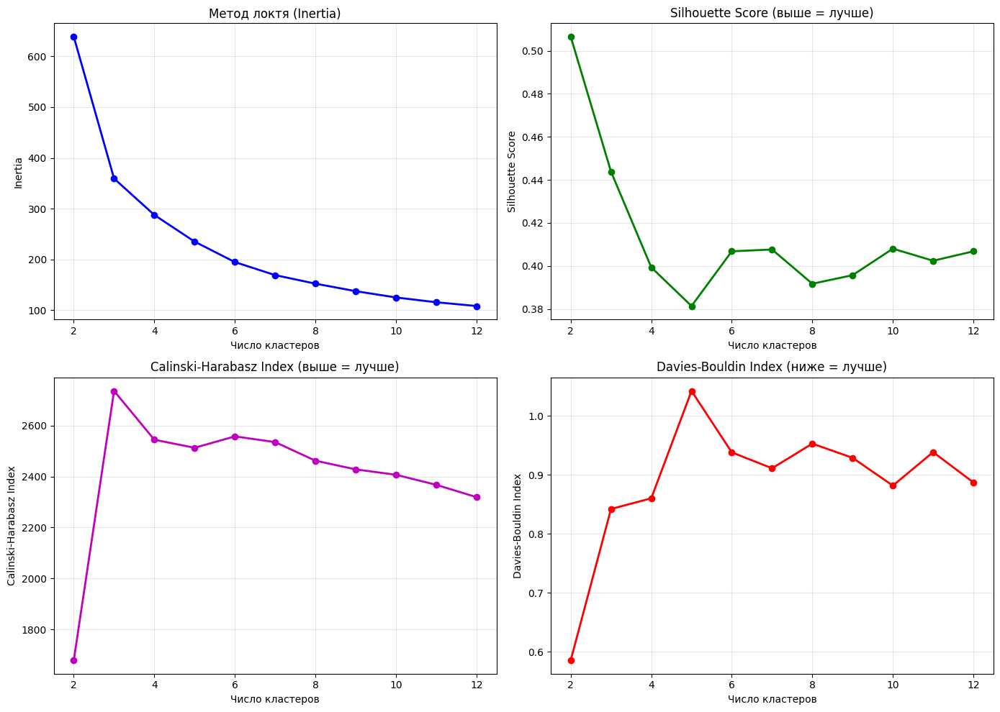


ОПТИМАЛЬНОЕ ЧИСЛО КЛАСТЕРОВ ПО РАЗНЫМ МЕТРИКАМ:
Метод локтя (Inertia): 11
Silhouette Score: 2 (значение: 0.5066)
Calinski-Harabasz Index: 3 (значение: 2735.68)
Davies-Bouldin Index: 2 (значение: 0.5858)

ТАБЛИЦА МЕТРИК ДЛЯ ВСЕХ КЛАСТЕРОВ:
k      Inertia         Silhouette   Calinski-Harabasz    Davies-Bouldin 
----------------------------------------------------------------------
2      638.61          0.5066       1679.22              0.5858         
3      359.39          0.4438       2735.68              0.8420         
4      287.64          0.3993       2544.30              0.8601         
5      235.11          0.3814       2512.56              1.0420         
6      194.82          0.4068       2557.31              0.9379         
7      169.14          0.4076       2534.86              0.9110         
8      152.34          0.3917       2462.04              0.9528         
9      137.56          0.3957       2427.90              0.9287         
10     125.14          0.4080   

In [31]:
optimal_clusters = find_optimal_clusters(X_scaled, max_k=12)

In [32]:
# попробуем следующие кластеры, основываясь на полученных результатах

optimal_k = [4, 6, 10]

Оптимальное значение eps (точка изгиба): 0.1096


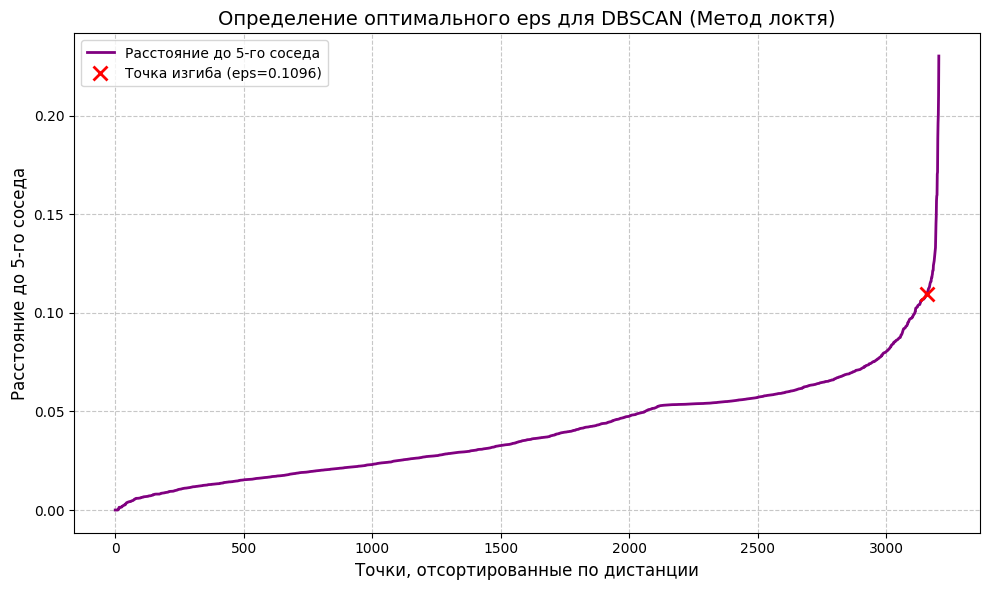

In [33]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.neighbors import NearestNeighbors
from kneed import KneeLocator

def find_optimal_eps(X, k=5):
    """
    Определение оптимального значения eps для алгоритма DBSCAN
    с визуализацией точки максимального изгиба.
    """
    # Находим расстояния до k-го ближайшего соседа [[1]] [[9]]
    neigh = NearestNeighbors(n_neighbors=k)
    neigh.fit(X)
    distances, _ = neigh.kneighbors(X)

    # Берем расстояние до k-го соседа (индекс k-1) и сортируем
    distances = np.sort(distances[:, k-1])
    indices = np.arange(len(distances)) # Индексы для оси X

    # Находим точку максимального изгиба (перегиба) ДО отрисовки
    kl = KneeLocator(indices, distances, curve='convex', direction='increasing')

    # Визуализируем график расстояний
    plt.figure(figsize=(10, 6))
    plt.plot(indices, distances, linewidth=2, color='purple', label=f'Расстояние до {k}-го соседа')
    plt.xlabel('Точки, отсортированные по дистанции', fontsize=12)
    plt.ylabel(f'Расстояние до {k}-го соседа', fontsize=12)
    plt.title('Определение оптимального eps для DBSCAN (Метод локтя)', fontsize=14)

    # Если точка изгиба найдена, отмечаем ее на графике
    if kl.knee is not None:
        optimal_eps = distances[kl.knee]
        plt.plot(kl.knee, optimal_eps, 'rx', markersize=10, mew=2, # Красный крестик, увеличенный размер, толщина линии
                 label=f'Точка изгиба (eps={optimal_eps:.4f})')
        print(f"Оптимальное значение eps (точка изгиба): {optimal_eps:.4f}")
    else:
        optimal_eps = None # Устанавливаем в None, если точка не найдена
        print("Не удалось автоматически определить точку изгиба.")

    plt.grid(True, linestyle='--', alpha=0.7)
    plt.legend() # Показываем легенду с метками
    plt.tight_layout()
    plt.show()

    # Возвращаем найденное значение или fallback
    if optimal_eps is not None:
        return optimal_eps
    else:
        # Возвращаем примерное значение, если автоматическое определение не удалось

        eps_guess = np.percentile(distances, 10)
        print(f"Предлагаемое значение eps (10-й процентиль): {eps_guess:.4f}")
        return eps_guess


# Определяем оптимальный параметр eps для DBSCAN
optimal_eps = find_optimal_eps(X_scaled, k=5)

### **4. Сравнительный анализ алгоритмов кластеризации**


- Реализуйте и сравните следующие алгоритмы кластеризации:
  - K-means
  - Агломеративная кластеризация
  - Спектральная кластеризация
  - DBSCAN (с оптимальным значением eps)
  - HDBSCAN
- Для каждого алгоритма оцените:
  - Качество кластеризации по основным метрикам
  - Распределение точек по кластерам
  - Характерные особенности выявленных кластеров

In [34]:
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score

def evaluate_clustering(X, labels, algorithm_name):
    """
    Оценка качества кластеризации по различным метрикам
    """
    n_clusters = len(np.unique(labels))
    if -1 in labels:  # Исключаем шумовые точки для DBSCAN/HDBSCAN
        n_clusters -= 1

    metrics = {}

    if n_clusters > 1:  # Все метрики требуют минимум 2 кластера
        metrics['silhouette'] = silhouette_score(X, labels)
        metrics['calinski'] = calinski_harabasz_score(X, labels)
        metrics['davies'] = davies_bouldin_score(X, labels)
    else:
        metrics['silhouette'] = np.nan
        metrics['calinski'] = np.nan
        metrics['davies'] = np.nan

    print(f"\nМетрики качества кластеризации для {algorithm_name}:")
    print(f"Количество кластеров: {n_clusters}")
    print(f"Silhouette Score: {metrics['silhouette']:.4f}")
    print(f"Calinski-Harabasz Index: {metrics['calinski']:.4f}")
    print(f"Davies-Bouldin Index: {metrics['davies']:.4f}")
    val, cnt = np.unique(labels, return_counts=True)
    res = {}
    for i in val:
        res[i] = cnt[i]
    print("Распределение точек:")
    print(pd.DataFrame.from_dict(res, orient='index'))

    return metrics

In [35]:
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import SpectralClustering
from sklearn.cluster import DBSCAN
import hdbscan

results={}
hdbscan = hdbscan.HDBSCAN()
hdbscan_labels = hdbscan.fit_predict(X_scaled)

dbscan = DBSCAN(eps=optimal_eps)
dbscan_labels = dbscan.fit_predict(X_scaled)

hdbscan_metrics = evaluate_clustering(X_scaled, hdbscan_labels, "HDBSCAN")
dbscan_metrics = evaluate_clustering(X_scaled, dbscan_labels, "DBSCAN")
results['DBSCAN'] = dbscan_metrics
results['HDBSCAN'] = hdbscan_metrics


for k in optimal_k:
    spectral = SpectralClustering(n_clusters=k, random_state=42, assign_labels='kmeans')
    agglom = AgglomerativeClustering(n_clusters=k)
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)

    spectral_labels = spectral.fit_predict(X_scaled)
    agglom_labels = agglom.fit_predict(X_scaled)
    kmeans_labels = kmeans.fit_predict(X_scaled)

    spectral_metrics = evaluate_clustering(X_scaled, spectral_labels, f"Spectral (k: {k})")
    kmeans_metrics = evaluate_clustering(X_scaled, kmeans_labels, f"KMeans (k: {k})")
    agglom_metrics = evaluate_clustering(X_scaled, agglom_labels, f"Агломеративная кластеризация (k: {k})")

    results[f'Spectral (k: {k})'] = spectral_metrics
    results[f'KMeans (k: {k})'] = kmeans_metrics
    results[f'Агломеративная (k: {k})'] = agglom_metrics


Метрики качества кластеризации для HDBSCAN:
Количество кластеров: 145
Silhouette Score: 0.0275
Calinski-Harabasz Index: 47.7015
Davies-Bouldin Index: 1.3838
Распределение точек:
        0
-1     23
 0    919
 1      5
 2     28
 3     11
...   ...
 140    8
 141    8
 142    6
 143   15
 144   10

[146 rows x 1 columns]

Метрики качества кластеризации для DBSCAN:
Количество кластеров: 4
Silhouette Score: 0.1591
Calinski-Harabasz Index: 450.7626
Davies-Bouldin Index: 1.9948
Распределение точек:
       0
-1     6
 0    21
 1  2819
 2   335
 3    25

Метрики качества кластеризации для Spectral (k: 4):
Количество кластеров: 4
Silhouette Score: 0.3910
Calinski-Harabasz Index: 2477.6701
Davies-Bouldin Index: 0.9198
Распределение точек:
      0
0   912
1   712
2   340
3  1242

Метрики качества кластеризации для KMeans (k: 4):
Количество кластеров: 4
Silhouette Score: 0.3993
Calinski-Harabasz Index: 2544.2951
Davies-Bouldin Index: 0.8601
Распределение точек:
      0
0   643
1   834
2   340
3 

In [36]:
pd.DataFrame.from_dict(results, orient='index').sort_values(by='silhouette', ascending=False)

,silhouette,calinski,davies
KMeans (k: 10),0.408024,2406.757670,0.881585
KMeans (k: 6),0.406802,2557.306120,0.937927
KMeans (k: 4),0.399343,2544.295134,0.860121
Spectral (k: 4),0.390983,2477.670112,0.919813
Spectral (k: 6),0.384113,2258.250194,0.913863
Агломеративная (k: 6),0.383476,2369.256456,0.998536
Агломеративная (k: 4),0.378781,2348.777654,0.815727
Агломеративная (k: 10),0.370676,2168.571102,1.003018
Spectral (k: 10),0.360493,1916.574981,0.911756
DBSCAN,0.159061,450.762577,1.994850


Хоть KMeans с k=10 и показал наилучшие результаты по метрикам, но такое количество кластеров будет трудно описать в данной работе. Поэтому, выберем KMeans с k=4

Характерные особенности будут описаны в следующем шаге

In [44]:
best_model = KMeans(n_clusters=4, random_state=42, n_init=10)
labels = best_model.fit_predict(X_scaled)

### **5. Визуализация и интерпретация результатов**


- Визуализируйте результаты кластеризации на карте с использованием leafmap


In [45]:
# Добавляем метки кластеров в исходный GeoDataFrame
h3_gdf_viz['cluster'] = labels.astype("str")

# Создаем карту с кластерами
map_clusters = leafmap.Map(center=[(bbox[1]+bbox[3])/2, (bbox[0]+bbox[2])/2], zoom=11, basemap='CartoDB.Positron')
map_clusters.add_data(
    h3_gdf_viz,
    column="cluster",
    cmap="OrRd_r",
    scheme='EqualInterval',
    legend_title="Кластеры",
    layer_name="H3 Кластеризация",
    style={
        "stroke": False,
        "weight": 0.5,
        "fillOpacity": 0.7,
    },
    info_mode='on_click'
)

# Отображаем карту
map_clusters

Map(center=[55.674853999999996, 37.727712499999996], controls=(ZoomControl(options=['position', 'zoom_in_text'…

- Постройте тепловые карты средних значений экологических факторов для каждого кластера

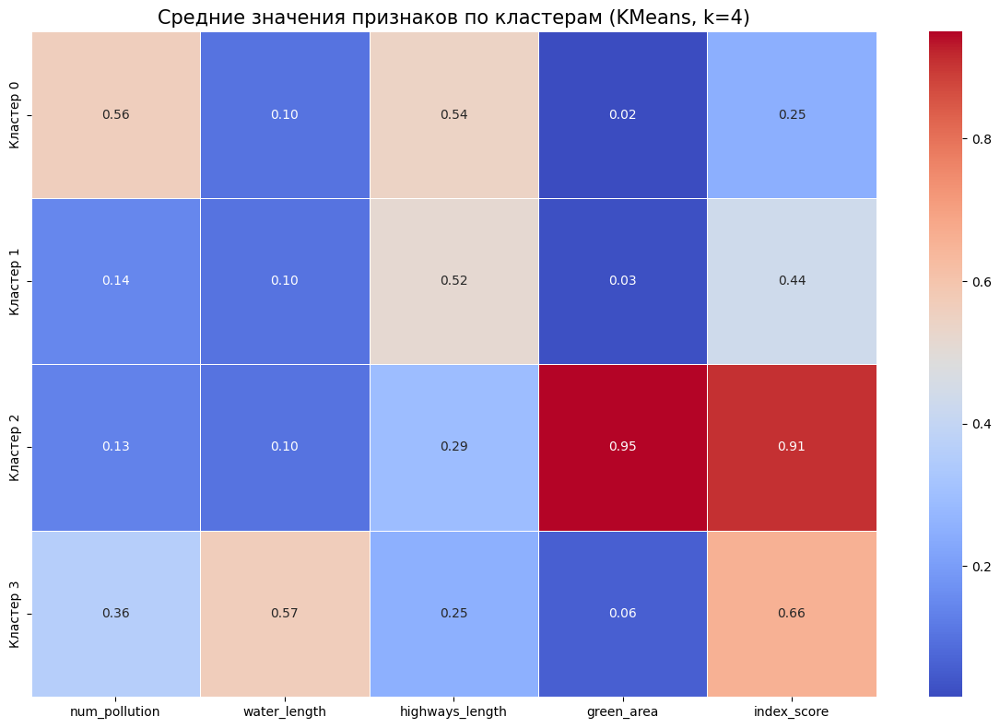

In [46]:
import seaborn as sns

# Создаем тепловую карту средних значений признаков по кластерам
unique_clusters = np.unique(labels)

scaler = MinMaxScaler()
X_scaled2 = scaler.fit_transform(X)
# Вычисляем средние значения признаков для каждого кластера
cluster_means = []
for cluster in unique_clusters:
    if cluster != -1:  # Пропускаем шумовые точки
        cluster_data = X_scaled2[labels == cluster]
        cluster_means.append(cluster_data.mean(axis=0))

# Создаем DataFrame для тепловой карты
cluster_means_df = pd.DataFrame(
    cluster_means,
    index=[f'Кластер {i}' for i in unique_clusters if i != -1],
    columns=features2
)

# Визуализируем тепловую карту
plt.figure(figsize=(12, 8))
sns.heatmap(cluster_means_df, annot=True, cmap='coolwarm', fmt='.2f', linewidths=.5)
plt.title('Средние значения признаков по кластерам (KMeans, k=4)', fontsize=15)
plt.tight_layout()
plt.show()


- Выполните снижение размерности с помощью PCA и визуализируйте кластеры в двумерном пространстве

In [47]:
from sklearn.decomposition import PCA
import plotly.express as px

pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled2)

fig = px.scatter(X_pca, x=0, y=1, color=labels.astype("str"), title="Распределение ячеек по кластерам (KMeans, K=4)", labels={'0': 'PC1', '1': 'PC2', 'color': 'Кластер'}
)
fig.show()


- Проанализируйте профили кластеров и составьте их экологические характеристики


**Кластер 0 (643 зон, 20% всех зон):** зоны вблизи водных объектов, мало источников загрязнений и "зелёных" объектов, малая протяженность автомагистралей. Второй по месту индекс экологического благополучия, однако на самом деле экологическое состояние в подобной территории чуть выше среднего

**Кластер 1 (834 зон, 26% всех зон):** прямые источники загрязнения - большая плотность источников загрязнений, протяженность автомагистралей, практически отсутствуют "зелёные" и водные объекты. Имеет самый худший индекс из всех кластеров

**Кластер 2 (340 зон, 10% всех зон):** города или протяженные автомагистрали. Достаточно источников загрязнений, самая большая протяженность дорог, малое наличие "зелёных" и водных объектов. Индекс благополучия ниже среднего

**Кластер 3 (1389 зон, 44% всех зон):** зелёные зоны, в основном заполненные лесами и другими "зелёными" объектами, имеют наименьшее кол-во источников загрязнений, автомагистралей, небольшая протяженность водных объектов. Имеет наибольший индекс экологического благополучия

- Разработайте рекомендации по улучшению экологической обстановки для каждого типа территории



**Кластер 0**

- Закрепить статус зелёных зон в генплане, чтобы предотвратить точечную застройку.
- Поддерживать существующие деревья (лечение, замена старых).
- Вовлекать жителей в уход за скверами.

**Кластер 1**

- Создать «зелёные коридоры» вдоль основных магистралей (деревья + кустарники), которые помогуть снизить шум и пыль.
- Внедрить «эко-часы» для грузового транспорта в жилых зонах.
- Оборудовать площадки для раздельного сбора отходов с мотивацией для жителей.
- Установить датчики качества воздуха с публичным доступом к данным.

**Кластер 2**

- Провести инвентаризацию дворовых территорий и выявить места для точечного озеленения.
- Развивать велопрокат, чтобы снизить число автомобилей.

**Кластер 3**

- Ввести режим особой охраны: запрет на новое строительство, ограничение доступа транспорта.
- Восстанавливать естественные экосистемы (убирать инвазивные виды, высаживать местные).
- Развивать экологический туризм с обязательным сопровождением гидов и правилами поведения.

### **6. Разработка моделей классификации**


- На основе результатов лучшего алгоритма кластеризации подготовьте данные для обучения классификаторов
- Обучите и сравните различные модели классификации:
  - Логистическая регрессия
  - Дерево решений
  - Случайный лес
  - Градиентный бустинг
  - SVM
  - K-ближайших соседей

In [48]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X_scaled2, labels, test_size=0.3, random_state=42)
X_train.shape, X_test.shape

((2244, 5), (962, 5))

In [49]:
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier

predictions = {}
models = {
    'Logistical Regression': LogisticRegression(random_state=42),
    'Decision Tree': DecisionTreeClassifier(random_state=42),
    'Random Forest': RandomForestClassifier(random_state=42),
    'Gradient Boosting': GradientBoostingClassifier(random_state=42),
    'SVC': SVC(),
    'KNN': KNeighborsClassifier(n_neighbors=4)
}
for name in models:
  models[name].fit(X_train, y_train)
  predictions[name] = models[name].predict(X_test)

In [50]:
from sklearn.metrics import classification_report

for model in predictions.keys():
  report = classification_report(y_test, predictions[model])
  print(f'{model}:')
  print(report)

Logistical Regression:
              precision    recall  f1-score   support

           0       1.00      0.98      0.99       209
           1       1.00      0.98      0.99       238
           2       1.00      1.00      1.00       106
           3       0.98      1.00      0.99       409

    accuracy                           0.99       962
   macro avg       0.99      0.99      0.99       962
weighted avg       0.99      0.99      0.99       962

Decision Tree:
              precision    recall  f1-score   support

           0       1.00      0.99      0.99       209
           1       0.99      0.98      0.99       238
           2       1.00      1.00      1.00       106
           3       0.98      0.99      0.99       409

    accuracy                           0.99       962
   macro avg       0.99      0.99      0.99       962
weighted avg       0.99      0.99      0.99       962

Random Forest:
              precision    recall  f1-score   support

           0       1.0


- Оцените качество моделей с использованием кросс-валидации

In [51]:
from sklearn.metrics import f1_score, accuracy_score, precision_score, recall_score
from sklearn.model_selection import KFold

def cross_validate(model, n_splits=None):
    cv = KFold(n_splits=n_splits, shuffle=True, random_state=42)

    f1_scores = []
    acc_scores = []
    prec_scores = []
    rec_scores = []

    for train_index, test_index in cv.split(X_scaled2, None):
        X_train, X_test = X_scaled2[train_index], X_scaled2[test_index]
        y_train, y_test = labels[train_index], labels[test_index]

        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)

        f1 = f1_score(y_test, y_pred, average='macro')
        acc = accuracy_score(y_test, y_pred)
        prec = precision_score(y_test, y_pred, average='macro')
        rec = recall_score(y_test, y_pred, average='macro')

        f1_scores.append(f1)
        acc_scores.append(acc)
        prec_scores.append(prec)
        rec_scores.append(rec)

    f1_mean = np.mean(f1_scores)
    acc_mean = np.mean(acc_scores)
    prec_mean = np.mean(prec_scores)
    rec_mean = np.mean(rec_scores)

    return {'F1': f1_mean, 'Accuracy': acc_mean, 'Precision': prec_mean, 'Recall': rec_mean}

In [52]:
res = {}
for name in models:
  res[name] = cross_validate(models[name], 5)

finale = pd.DataFrame.from_dict(res, orient='index').sort_values('F1', ascending=False)
finale

,F1,Accuracy,Precision,Recall
Gradient Boosting,0.993711,0.992825,0.993412,0.994052
Random Forest,0.993162,0.992201,0.992999,0.993373
Decision Tree,0.991132,0.989707,0.990862,0.991451
SVC,0.990747,0.989705,0.991617,0.989915
KNN,0.988600,0.987523,0.988266,0.989090
Logistical Regression,0.988058,0.986586,0.990649,0.985717


- Выберите оптимальную модель и сохраните её для дальнейшего использования

In [53]:
import joblib

best_model_name = finale.iloc[0].name
best_model = models[best_model_name]
display(best_model)

joblib.dump(best_model, 'best_ecology_model.pkl')
joblib.dump(scaler, 'scaler.pkl')

print(f"Лучшая модель ({best_model_name}) сохранена в 'best_ecology_model.pkl'")
print(f"Scaler сохранён в 'scaler.pkl'")

GradientBoostingClassifier(random_state=42)

Лучшая модель (Gradient Boosting) сохранена в 'best_ecology_model.pkl'
Scaler сохранён в 'scaler.pkl'


## **Требования к отчету (Структуре блокнота)**



1. Описание выбранной территории и источников данных
2. Методика расчета экологических показателей с обоснованием выбора буферных зон и весовых коэффициентов
3. Сравнительный анализ результатов кластеризации с обоснованием выбора оптимального алгоритма
4. Карты распределения экологических факторов и результатов кластеризации
5. Подробная характеристика выявленных экологических зон (кластеров) с рекомендациями по их развитию
6. Анализ эффективности разработанных моделей классификации
7. Выводы об экологическом состоянии исследуемой территории и возможностях практического применения полученных результатов

# **Отчет**

**1. Описание выбранной территории и источников данных**

Выбранная территория - Часть юго-восточного округа Москвы. Зона с умеренным количеством зеленых зон, водоемов и промзон

Источники данных:
  -  Геопространственные данные из OpenStreetMap

**2. Методика расчета экологических показателей с обоснованием выбора буферных зон и весовых коэффициентов**

**Плотность загрязнения**, ПЗ (num_pollution) — количество точечных источников загрязнения в ячейке.

**Протяжённость дорог** (ПД) и **водных объектов** (ВО) — суммарная длина линейных объектов в пределах ячейки.

**Доля зелёных зон**, ЗЗ (green_area) — количество зелёных зон в ячейке.

Все значения были нормализованы с помощью MinMaxScaler

Интегральный индекс (index_score) рассчитан следующим образом:

`index_score = ВО+ЗЗ-ПД-ПЗ`

**3. Сравнительный анализ результатов кластеризации с обоснованием выбора оптимального алгоритма**

При анализе алгоритмов лучше всего себя показывали KMeans и Спектральная кластеризации, Agglomerative тоже сработала относительно хорошо, но всё же хуже них.

DBSCAN и HDBSCAN подходили лишь для выявления возможных аномалий в данных и имели отрицательные показатели метрик.

Самым оптимальным оказался KMeans с k=10, однако из-за незначительного отличия по метрикам и неудобства описания стольких кластеров, было решено использовать **KMeans с k=4**

**4. Карты распределения экологических факторов и результатов кластеризации**

см. пункт 5

**5. Подробная характеристика выявленных экологических зон (кластеров) с рекомендациями по их развитию**

см. конец пункта 5

**6. Анализ эффективности разработанных моделей классификации**

Все модели классификации показали высокие оценки по метрикам, однако лучше всех оказалась модель SVC с F1-Score = 0.993711, что показывает её способность меньше делать ложных срабатываний и при этом не пропускать целевых объектов (баланс между точностью (precision) и полнотой (recall)

**7. Выводы об экологическом состоянии исследуемой территории и возможностях практического применения полученных результатов**

Территория имеет выраженную экологическую неоднородность: от сильно загрязнённых до благополучных лесопарковых зон.

44% ячеек отнесены к «благополучным» — такие территории являются приоритетными для сохранения экологического индекса.

Интегральный индекс и кластеризация позволяют ранжировать территории по приоритету повышения экологического благополучия.

Результаты можно использовать:

  - Для обоснования размещения новых зелёных зон;
  - При разработке программ экологического мониторинга;
  - Как входные данные для градостроительных моделей